In [2]:
import sys
import torch

print("Python:", sys.executable)
print("Torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())

Python: D:\PythonWork\Pytorch and deep learning\.venv\Scripts\python.exe
Torch: 2.11.0+cu128
CUDA: True


In [3]:
import os
import torch
import torch.nn as nn
import torch.optim as optim

from torchvision import datasets, transforms
from torch.utils.data import DataLoader
from torchvision.models import resnet50, ResNet50_Weights

print("Imports successful")
print("Torch:", torch.__version__)
print("CUDA:", torch.cuda.is_available())

Imports successful
Torch: 2.11.0+cu128
CUDA: True


In [4]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

print("Device:", device)

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))

Device: cuda
GPU: NVIDIA GeForce RTX 5050 Laptop GPU


In [28]:
plantvillage_path = r"D:\Projects\Agriculture\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)"

plantvillage_train_path = os.path.join(
    plantvillage_path,
    "train"
)

plantvillage_valid_path = os.path.join(
    plantvillage_path,
    "valid"
)

print("Train exists:", os.path.exists(plantvillage_train_path))
print("Valid exists:", os.path.exists(plantvillage_valid_path))

Train exists: True
Valid exists: True


In [29]:
plantdoc_path = r"D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master"

plantdoc_train_path = os.path.join(
    plantdoc_path,
    "train"
)

plantdoc_test_path = os.path.join(
    plantdoc_path,
    "test"
)

print("PlantDoc train exists:", os.path.exists(plantdoc_train_path))
print("PlantDoc test exists:", os.path.exists(plantdoc_test_path))

PlantDoc train exists: True
PlantDoc test exists: True


In [30]:
plantvillage_train_raw = datasets.ImageFolder(
    plantvillage_train_path
)

plantvillage_valid_raw = datasets.ImageFolder(
    plantvillage_valid_path
)

print("PlantVillage train images:", len(plantvillage_train_raw))
print("PlantVillage valid images:", len(plantvillage_valid_raw))
print("Number of classes:", len(plantvillage_train_raw.classes))

PlantVillage train images: 70295
PlantVillage valid images: 17575
Number of classes: 38


In [31]:
class_names = plantvillage_train_raw.classes
num_classes = len(class_names)

print("Number of classes:", num_classes)

for i, cls in enumerate(class_names):
    print(i, cls)

Number of classes: 38
0 Apple___Apple_scab
1 Apple___Black_rot
2 Apple___Cedar_apple_rust
3 Apple___healthy
4 Blueberry___healthy
5 Cherry_(including_sour)___Powdery_mildew
6 Cherry_(including_sour)___healthy
7 Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
8 Corn_(maize)___Common_rust_
9 Corn_(maize)___Northern_Leaf_Blight
10 Corn_(maize)___healthy
11 Grape___Black_rot
12 Grape___Esca_(Black_Measles)
13 Grape___Leaf_blight_(Isariopsis_Leaf_Spot)
14 Grape___healthy
15 Orange___Haunglongbing_(Citrus_greening)
16 Peach___Bacterial_spot
17 Peach___healthy
18 Pepper,_bell___Bacterial_spot
19 Pepper,_bell___healthy
20 Potato___Early_blight
21 Potato___Late_blight
22 Potato___healthy
23 Raspberry___healthy
24 Soybean___healthy
25 Squash___Powdery_mildew
26 Strawberry___Leaf_scorch
27 Strawberry___healthy
28 Tomato___Bacterial_spot
29 Tomato___Early_blight
30 Tomato___Late_blight
31 Tomato___Leaf_Mold
32 Tomato___Septoria_leaf_spot
33 Tomato___Spider_mites Two-spotted_spider_mite
34 Tomat

In [32]:
plantdoc_train_raw = datasets.ImageFolder(
    plantdoc_train_path
)

plantdoc_test_raw = datasets.ImageFolder(
    plantdoc_test_path
)

plantdoc_classes = plantdoc_train_raw.classes

print("PlantDoc train images:", len(plantdoc_train_raw))
print("PlantDoc test images:", len(plantdoc_test_raw))
print("PlantDoc train classes:", len(plantdoc_train_raw.classes))
print("PlantDoc test classes:", len(plantdoc_test_raw.classes))

PlantDoc train images: 2336
PlantDoc test images: 236
PlantDoc train classes: 28
PlantDoc test classes: 27


In [33]:
for i, cls in enumerate(plantdoc_classes):
    print(i, cls)

0 Apple Scab Leaf
1 Apple leaf
2 Apple rust leaf
3 Bell_pepper leaf
4 Bell_pepper leaf spot
5 Blueberry leaf
6 Cherry leaf
7 Corn Gray leaf spot
8 Corn leaf blight
9 Corn rust leaf
10 Peach leaf
11 Potato leaf early blight
12 Potato leaf late blight
13 Raspberry leaf
14 Soyabean leaf
15 Squash Powdery mildew leaf
16 Strawberry leaf
17 Tomato Early blight leaf
18 Tomato Septoria leaf spot
19 Tomato leaf
20 Tomato leaf bacterial spot
21 Tomato leaf late blight
22 Tomato leaf mosaic virus
23 Tomato leaf yellow virus
24 Tomato mold leaf
25 Tomato two spotted spider mites leaf
26 grape leaf
27 grape leaf black rot


In [34]:
plantdoc_to_plantvillage = {

    "Apple Scab Leaf":
        "Apple___Apple_scab",

    "Apple leaf":
        "Apple___healthy",

    "Apple rust leaf":
        "Apple___Cedar_apple_rust",

    "Bell_pepper leaf":
        "Pepper,_bell___healthy",

    "Bell_pepper leaf spot":
        "Pepper,_bell___Bacterial_spot",

    "Blueberry leaf":
        "Blueberry___healthy",

    "Cherry leaf":
        "Cherry_(including_sour)___healthy",

    "Corn Gray leaf spot":
        "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot",

    "Corn leaf blight":
        "Corn_(maize)___Northern_Leaf_Blight",

    "Corn rust leaf":
        "Corn_(maize)___Common_rust_",

    "Peach leaf":
        "Peach___healthy",

    "Potato leaf early blight":
        "Potato___Early_blight",

    "Potato leaf late blight":
        "Potato___Late_blight",

    "Raspberry leaf":
        "Raspberry___healthy",

    "Soyabean leaf":
        "Soybean___healthy",

    "Squash Powdery mildew leaf":
        "Squash___Powdery_mildew",

    "Strawberry leaf":
        "Strawberry___healthy",

    "Tomato Early blight leaf":
        "Tomato___Early_blight",

    "Tomato Septoria leaf spot":
        "Tomato___Septoria_leaf_spot",

    "Tomato leaf":
        "Tomato___healthy",

    "Tomato leaf bacterial spot":
        "Tomato___Bacterial_spot",

    "Tomato leaf late blight":
        "Tomato___Late_blight",

    "Tomato leaf mosaic virus":
        "Tomato___Tomato_mosaic_virus",

    "Tomato leaf yellow virus":
        "Tomato___Tomato_Yellow_Leaf_Curl_Virus",

    "Tomato mold leaf":
        "Tomato___Leaf_Mold",

    "Tomato two spotted spider mites leaf":
        "Tomato___Spider_mites Two-spotted_spider_mite",

    "grape leaf":
        "Grape___healthy",

    "grape leaf black rot":
        "Grape___Black_rot"
}

In [35]:
print("Mapped PlantDoc classes:\n")

for plantdoc_class, plantvillage_class in plantdoc_to_plantvillage.items():
    print(
        f"{plantdoc_class}  -->  {plantvillage_class}"
    )

print("\nTotal mapped classes:", len(plantdoc_to_plantvillage))

Mapped PlantDoc classes:

Apple Scab Leaf  -->  Apple___Apple_scab
Apple leaf  -->  Apple___healthy
Apple rust leaf  -->  Apple___Cedar_apple_rust
Bell_pepper leaf  -->  Pepper,_bell___healthy
Bell_pepper leaf spot  -->  Pepper,_bell___Bacterial_spot
Blueberry leaf  -->  Blueberry___healthy
Cherry leaf  -->  Cherry_(including_sour)___healthy
Corn Gray leaf spot  -->  Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Corn leaf blight  -->  Corn_(maize)___Northern_Leaf_Blight
Corn rust leaf  -->  Corn_(maize)___Common_rust_
Peach leaf  -->  Peach___healthy
Potato leaf early blight  -->  Potato___Early_blight
Potato leaf late blight  -->  Potato___Late_blight
Raspberry leaf  -->  Raspberry___healthy
Soyabean leaf  -->  Soybean___healthy
Squash Powdery mildew leaf  -->  Squash___Powdery_mildew
Strawberry leaf  -->  Strawberry___healthy
Tomato Early blight leaf  -->  Tomato___Early_blight
Tomato Septoria leaf spot  -->  Tomato___Septoria_leaf_spot
Tomato leaf  -->  Tomato___healthy
Tomato 

In [36]:
train_transform = transforms.Compose([
    transforms.RandomResizedCrop(
        224,
        scale=(0.7, 1.0)
    ),

    transforms.RandomHorizontalFlip(),

    transforms.RandomRotation(20),

    transforms.ColorJitter(
        brightness=0.2,
        contrast=0.2,
        saturation=0.2,
        hue=0.05
    ),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [37]:
valid_transform = transforms.Compose([
    transforms.Resize((224, 224)),

    transforms.ToTensor(),

    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [38]:
train_dataset = datasets.ImageFolder(
    plantvillage_train_path,
    transform=train_transform
)

valid_dataset = datasets.ImageFolder(
    plantvillage_valid_path,
    transform=valid_transform
)

print("Train:", len(train_dataset))
print("Valid:", len(valid_dataset))
print("Classes:", len(train_dataset.classes))

Train: 70295
Valid: 17575
Classes: 38


In [39]:
assert train_dataset.classes == class_names
assert valid_dataset.classes == class_names

print("Class mapping verified.")

Class mapping verified.


In [40]:
train_loader = DataLoader(
    train_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=0
)

valid_loader = DataLoader(
    valid_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=0
)

print("Train batch size:", train_loader.batch_size)
print("Valid batch size:", valid_loader.batch_size)

Train batch size: 16
Valid batch size: 16


In [41]:
weights = ResNet50_Weights.DEFAULT

model = resnet50(weights=weights)

model.fc = nn.Linear(
    model.fc.in_features,
    num_classes
)

model = model.to(device)

print(model.fc)

Linear(in_features=2048, out_features=38, bias=True)


In [42]:
for param in model.parameters():
    param.requires_grad = False

for param in model.fc.parameters():
    param.requires_grad = True

print("Only FC layer is trainable.")

Only FC layer is trainable.


In [43]:
criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    model.fc.parameters(),
    lr=0.001
)

print("Loss and optimizer ready.")

Loss and optimizer ready.


In [44]:
def train_one_epoch(
    model,
    loader,
    criterion,
    optimizer,
    device
):

    model.train()

    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)

        loss = criterion(outputs, labels)

        loss.backward()

        optimizer.step()

        running_loss += loss.item() * images.size(0)

        predictions = outputs.argmax(dim=1)

        correct += (
            predictions == labels
        ).sum().item()

        total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [45]:
def evaluate(
    model,
    loader,
    criterion,
    device
):

    model.eval()

    running_loss = 0.0
    correct = 0
    total = 0

    with torch.no_grad():

        for images, labels in loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)

            loss = criterion(
                outputs,
                labels
            )

            running_loss += (
                loss.item() * images.size(0)
            )

            predictions = outputs.argmax(dim=1)

            correct += (
                predictions == labels
            ).sum().item()

            total += labels.size(0)

    epoch_loss = running_loss / total
    epoch_accuracy = correct / total

    return epoch_loss, epoch_accuracy

In [41]:
num_epochs = 3

stage1_history = []

for epoch in range(num_epochs):

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )

    valid_loss, valid_acc = evaluate(
        model,
        valid_loader,
        criterion,
        device
    )

    stage1_history.append({
        "train_loss": train_loss,
        "train_acc": train_acc,
        "valid_loss": valid_loss,
        "valid_acc": valid_acc
    })

    print(
        f"Epoch {epoch+1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Valid Loss: {valid_loss:.4f} | "
        f"Valid Acc: {valid_acc*100:.2f}%"
    )

KeyboardInterrupt: 

In [46]:
for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

print("Layer 4 and FC are trainable.")

Layer 4 and FC are trainable.


In [47]:
import torch

print("CUDA:", torch.cuda.is_available())

if torch.cuda.is_available():
    print("GPU:", torch.cuda.get_device_name(0))
    print(
        "GPU memory allocated:",
        torch.cuda.memory_allocated() / 1024**3,
        "GB"
    )
    print(
        "GPU memory reserved:",
        torch.cuda.memory_reserved() / 1024**3,
        "GB"
    )

CUDA: True
GPU: NVIDIA GeForce RTX 5050 Laptop GPU
GPU memory allocated: 0.40764617919921875 GB
GPU memory reserved: 0.677734375 GB


In [48]:
images, labels = next(iter(train_loader))

images = images.to(device)
labels = labels.to(device)

print("Batch shape:", images.shape)

outputs = model(images)

print("Output shape:", outputs.shape)

loss = criterion(outputs, labels)

print("Loss:", loss.item())

loss.backward()

print("Backward pass successful!")

model.zero_grad()

Batch shape: torch.Size([16, 3, 224, 224])
Output shape: torch.Size([16, 38])
Loss: 3.6382336616516113
Backward pass successful!


In [49]:
model.train()

for batch_idx, (images, labels) in enumerate(train_loader):

    images = images.to(device)
    labels = labels.to(device)

    optimizer.zero_grad()

    outputs = model(images)

    loss = criterion(outputs, labels)

    loss.backward()

    optimizer.step()

    if (batch_idx + 1) % 20 == 0:
        print(
            f"Batch {batch_idx + 1}/100 | "
            f"Loss: {loss.item():.4f}"
        )

    if batch_idx + 1 == 100:
        break

print("100-batch training test completed.")

Batch 20/100 | Loss: 3.4552
Batch 40/100 | Loss: 3.0353
Batch 60/100 | Loss: 2.9252
Batch 80/100 | Loss: 2.5271
Batch 100/100 | Loss: 2.4704
100-batch training test completed.


In [50]:
best_valid_acc = 0.0
best_model_state = None
best_model_path = "plant_disease_resnet50_best.pth"

In [44]:
num_epochs = 3

stage1_history = []

for epoch in range(num_epochs):

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )

    valid_loss, valid_acc = evaluate(
        model,
        valid_loader,
        criterion,
        device
    )

    stage1_history.append({
        "train_loss": train_loss,
        "train_acc": train_acc,
        "valid_loss": valid_loss,
        "valid_acc": valid_acc
    })

    print(
        f"Epoch {epoch+1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Valid Loss: {valid_loss:.4f} | "
        f"Valid Acc: {valid_acc*100:.2f}%"
    )

Epoch 1/3 | Train Loss: 0.4361 | Train Acc: 89.92% | Valid Loss: 0.2376 | Valid Acc: 93.91%
Epoch 2/3 | Train Loss: 0.2243 | Train Acc: 93.58% | Valid Loss: 0.1800 | Valid Acc: 95.03%
Epoch 3/3 | Train Loss: 0.1815 | Train Acc: 94.58% | Valid Loss: 0.1462 | Valid Acc: 95.58%


In [27]:
for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

print("Layer 4 and FC are trainable.")

Layer 4 and FC are trainable.


In [28]:
optimizer = optim.Adam(
    filter(
        lambda p: p.requires_grad,
        model.parameters()
    ),
    lr=0.0001
)

print("Stage 2 optimizer ready.")

Stage 2 optimizer ready.


In [29]:
best_valid_acc = 0.0

best_model_path = (
    "plant_disease_resnet50_best.pth"
)

best_model_state = None

In [52]:
import copy
num_epochs = 4

stage2_history = []

for epoch in range(num_epochs):

    train_loss, train_acc = train_one_epoch(
        model,
        train_loader,
        criterion,
        optimizer,
        device
    )

    valid_loss, valid_acc = evaluate(
        model,
        valid_loader,
        criterion,
        device
    )

    stage2_history.append({
        "train_loss": train_loss,
        "train_acc": train_acc,
        "valid_loss": valid_loss,
        "valid_acc": valid_acc
    })

    print(
        f"Epoch {epoch+1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Valid Loss: {valid_loss:.4f} | "
        f"Valid Acc: {valid_acc*100:.2f}%"
    )

    if valid_acc > best_valid_acc:

        best_valid_acc = valid_acc

        best_model_state = copy.deepcopy(
            model.state_dict()
        )

        torch.save(
            {
                "model_state_dict": best_model_state,
                "class_names": class_names,
                "num_classes": num_classes,
                "best_valid_acc": best_valid_acc
            },
            best_model_path
        )

        print(
            f"  → Best model saved: "
            f"{best_valid_acc*100:.2f}%"
        )

Epoch 1/4 | Train Loss: 0.0199 | Train Acc: 99.34% | Valid Loss: 0.0151 | Valid Acc: 99.43%
  → Best model saved: 99.43%
Epoch 2/4 | Train Loss: 0.0161 | Train Acc: 99.45% | Valid Loss: 0.0154 | Valid Acc: 99.48%
  → Best model saved: 99.48%
Epoch 3/4 | Train Loss: 0.0149 | Train Acc: 99.50% | Valid Loss: 0.0111 | Valid Acc: 99.64%
  → Best model saved: 99.64%
Epoch 4/4 | Train Loss: 0.0126 | Train Acc: 99.59% | Valid Loss: 0.0136 | Valid Acc: 99.57%


In [32]:
print("Best validation accuracy:", best_valid_acc * 100)
print("Best model path:", best_model_path)

Best validation accuracy: 99.63584637268848
Best model path: plant_disease_resnet50_best.pth


In [31]:
checkpoint = torch.load(
    best_model_path,
    map_location=device
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

best_valid_acc = checkpoint["best_valid_acc"]

print(f"Loaded best model: {best_valid_acc*100:.2f}%")

Loaded best model: 99.64%


In [33]:
valid_loss, valid_acc = evaluate(
    model,
    valid_loader,
    criterion,
    device
)

print(f"Reloaded Model Validation Loss: {valid_loss:.4f}")
print(f"Reloaded Model Validation Accuracy: {valid_acc*100:.2f}%")

Reloaded Model Validation Loss: 0.0111
Reloaded Model Validation Accuracy: 99.64%


In [51]:
plantdoc_base = r"D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master"

plantdoc_train_dir = os.path.join(plantdoc_base, "train")
plantdoc_test_dir = os.path.join(plantdoc_base, "test")

print("Train path:", plantdoc_train_dir)
print("Test path:", plantdoc_test_dir)

Train path: D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master\train
Test path: D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master\test


In [52]:
plantdoc_train = datasets.ImageFolder(
    plantdoc_train_dir
)

plantdoc_test = datasets.ImageFolder(
    plantdoc_test_dir
)

print("PlantDoc Train:", len(plantdoc_train))
print("PlantDoc Test:", len(plantdoc_test))
print("PlantDoc classes:", len(plantdoc_train.classes))

PlantDoc Train: 2336
PlantDoc Test: 236
PlantDoc classes: 28


In [53]:
plantdoc_samples = []

for class_name in plantdoc_train.classes:
    if class_name in plantdoc_to_plantvillage:
        target_class = plantdoc_to_plantvillage[class_name]
        target_idx = class_names.index(target_class)

        class_idx = plantdoc_train.class_to_idx[class_name]

        for path, _ in plantdoc_train.samples:
            if _ == class_idx:
                plantdoc_samples.append((path, target_idx))

print("Total PlantDoc mapped images:", len(plantdoc_samples))
print("Mapped classes:", len(set(label for _, label in plantdoc_samples)))

Total PlantDoc mapped images: 2336
Mapped classes: 28


In [54]:
plantdoc_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

In [55]:
class PlantDocMappedDataset(torch.utils.data.Dataset):

    def __init__(self, samples, transform=None):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]

        image = Image.open(path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label

In [56]:
plantdoc_dataset = PlantDocMappedDataset(
    plantdoc_samples,
    transform=plantdoc_transform
)

print("PlantDoc mapped dataset size:", len(plantdoc_dataset))

PlantDoc mapped dataset size: 2336


In [57]:
plantdoc_loader = DataLoader(
    plantdoc_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=0
)

print("PlantDoc DataLoader ready")

PlantDoc DataLoader ready


In [58]:
from PIL import Image
images, labels = next(iter(plantdoc_loader))

print("Batch image shape:", images.shape)
print("Batch labels shape:", labels.shape)
print("Unique labels in batch:", labels.unique().tolist())

Batch image shape: torch.Size([16, 3, 224, 224])
Batch labels shape: torch.Size([16])
Unique labels in batch: [4, 7, 8, 9, 11, 14, 17, 19, 23, 30, 31, 32]


In [59]:
for param in model.parameters():
    param.requires_grad = False

for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

In [43]:
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5
)

print("PlantDoc fine-tuning optimizer ready")

PlantDoc fine-tuning optimizer ready


In [44]:
trainable_params = sum(
    p.numel()
    for p in model.parameters()
    if p.requires_grad
)

total_params = sum(
    p.numel()
    for p in model.parameters()
)

print(f"Trainable parameters: {trainable_params:,}")
print(f"Total parameters: {total_params:,}")
print(f"Trainable percentage: {trainable_params/total_params*100:.2f}%")

Trainable parameters: 15,042,598
Total parameters: 23,585,894
Trainable percentage: 63.78%


In [45]:
for name, param in model.named_parameters():
    if param.requires_grad:
        print(name)

layer4.0.conv1.weight
layer4.0.bn1.weight
layer4.0.bn1.bias
layer4.0.conv2.weight
layer4.0.bn2.weight
layer4.0.bn2.bias
layer4.0.conv3.weight
layer4.0.bn3.weight
layer4.0.bn3.bias
layer4.0.downsample.0.weight
layer4.0.downsample.1.weight
layer4.0.downsample.1.bias
layer4.1.conv1.weight
layer4.1.bn1.weight
layer4.1.bn1.bias
layer4.1.conv2.weight
layer4.1.bn2.weight
layer4.1.bn2.bias
layer4.1.conv3.weight
layer4.1.bn3.weight
layer4.1.bn3.bias
layer4.2.conv1.weight
layer4.2.bn1.weight
layer4.2.bn1.bias
layer4.2.conv2.weight
layer4.2.bn2.weight
layer4.2.bn2.bias
layer4.2.conv3.weight
layer4.2.bn3.weight
layer4.2.bn3.bias
fc.weight
fc.bias


In [46]:
valid_plantdoc_samples = []

missing_count = 0

for path, label in plantdoc_samples:
    if os.path.exists(path):
        valid_plantdoc_samples.append((path, label))
    else:
        missing_count += 1

plantdoc_samples = valid_plantdoc_samples

print("Valid PlantDoc images:", len(plantdoc_samples))
print("Missing images skipped:", missing_count)

Valid PlantDoc images: 2328
Missing images skipped: 8


In [47]:
plantdoc_dataset = PlantDocMappedDataset(
    plantdoc_samples,
    transform=plantdoc_transform
)

print("PlantDoc dataset size:", len(plantdoc_dataset))

PlantDoc dataset size: 2328


In [48]:
plantdoc_loader = DataLoader(
    plantdoc_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=0
)

print("PlantDoc DataLoader ready")

PlantDoc DataLoader ready


In [49]:
images, labels = next(iter(plantdoc_loader))

print("Batch image shape:", images.shape)
print("Batch labels shape:", labels.shape)

Batch image shape: torch.Size([16, 3, 224, 224])
Batch labels shape: torch.Size([16])


In [76]:
num_epochs = 3

plantdoc_history = []

for epoch in range(num_epochs):

    train_loss, train_acc = train_one_epoch(
        model,
        plantdoc_loader,
        criterion,
        optimizer,
        device
    )

    plantdoc_history.append({
        "train_loss": train_loss,
        "train_acc": train_acc
    })

    print(
        f"Epoch {epoch+1}/{num_epochs} | "
        f"PlantDoc Loss: {train_loss:.4f} | "
        f"PlantDoc Acc: {train_acc*100:.2f}%"
    )

Epoch 1/3 | PlantDoc Loss: 5.0636 | PlantDoc Acc: 20.92%
Epoch 2/3 | PlantDoc Loss: 4.1601 | PlantDoc Acc: 24.66%
Epoch 3/3 | PlantDoc Loss: 3.5499 | PlantDoc Acc: 28.78%


In [52]:
valid_loss, valid_acc = evaluate(
    model,
    valid_loader,
    criterion,
    device
)

print(f"Original Validation Loss: {valid_loss:.4f}")
print(f"Original Validation Accuracy: {valid_acc*100:.2f}%")

Original Validation Loss: 0.0111
Original Validation Accuracy: 99.64%


In [51]:
checkpoint = torch.load(
    best_model_path,
    map_location=device
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

print(
    f"Restored model: "
    f"{checkpoint['best_valid_acc']*100:.2f}%"
)

Restored model: 99.64%


In [53]:
combined_samples = []

# Original dataset samples
for path, label in train_dataset.samples:
    combined_samples.append((path, label))

# PlantDoc samples
combined_samples.extend(plantdoc_samples)

print("Original images:", len(train_dataset.samples))
print("PlantDoc images:", len(plantdoc_samples))
print("Combined images:", len(combined_samples))

Original images: 70295
PlantDoc images: 2328
Combined images: 72623


In [54]:
class CombinedPlantDataset(torch.utils.data.Dataset):

    def __init__(self, original_samples, plantdoc_samples,
                 original_transform, plantdoc_transform):

        self.original_samples = original_samples
        self.plantdoc_samples = plantdoc_samples
        self.original_transform = original_transform
        self.plantdoc_transform = plantdoc_transform

    def __len__(self):
        return len(self.original_samples) + len(self.plantdoc_samples)

    def __getitem__(self, idx):

        if idx < len(self.original_samples):

            path, label = self.original_samples[idx]

            image = Image.open(path).convert("RGB")
            image = self.original_transform(image)

        else:

            idx = idx - len(self.original_samples)

            path, label = self.plantdoc_samples[idx]

            image = Image.open(path).convert("RGB")
            image = self.plantdoc_transform(image)

        return image, label

In [55]:
combined_dataset = CombinedPlantDataset(
    train_dataset.samples,
    plantdoc_samples,
    train_transform,
    plantdoc_transform
)

combined_loader = DataLoader(
    combined_dataset,
    batch_size=16,
    shuffle=True,
    num_workers=0
)

print("Combined dataset:", len(combined_dataset))
print("Combined DataLoader ready")

Combined dataset: 72623
Combined DataLoader ready


In [56]:
for param in model.parameters():
    param.requires_grad = False

for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

In [57]:
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5
)

print("Combined fine-tuning optimizer ready")

Combined fine-tuning optimizer ready


In [84]:
images, labels = next(iter(combined_loader))

print("Batch image shape:", images.shape)
print("Batch labels shape:", labels.shape)

Batch image shape: torch.Size([16, 3, 224, 224])
Batch labels shape: torch.Size([16])


In [85]:
num_epochs = 2

combined_history = []

for epoch in range(num_epochs):

    train_loss, train_acc = train_one_epoch(
        model,
        combined_loader,
        criterion,
        optimizer,
        device
    )

    valid_loss, valid_acc = evaluate(
        model,
        valid_loader,
        criterion,
        device
    )

    combined_history.append({
        "train_loss": train_loss,
        "train_acc": train_acc,
        "valid_loss": valid_loss,
        "valid_acc": valid_acc
    })

    print(
        f"Epoch {epoch+1}/{num_epochs} | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Valid Loss: {valid_loss:.4f} | "
        f"Valid Acc: {valid_acc*100:.2f}%"
    )

Epoch 1/2 | Train Loss: 0.1041 | Train Acc: 97.56% | Valid Loss: 0.0083 | Valid Acc: 99.74%
Epoch 2/2 | Train Loss: 0.0687 | Train Acc: 98.09% | Valid Loss: 0.0085 | Valid Acc: 99.74%


In [58]:
final_model_path = "plant_disease_resnet50_combined_best.pth"

torch.save(
    {
        "model_state_dict": model.state_dict(),
        "class_names": class_names,
        "num_classes": num_classes,
        "valid_acc": 0.9974
    },
    final_model_path
)

print(f"Model saved: {final_model_path}")

Model saved: plant_disease_resnet50_combined_best.pth


In [59]:
plantdoc_test_samples = []

for path, class_idx in plantdoc_test.samples:

    class_name = plantdoc_test.classes[class_idx]

    if class_name in plantdoc_to_plantvillage:

        target_class = plantdoc_to_plantvillage[class_name]
        target_idx = class_names.index(target_class)

        plantdoc_test_samples.append((path, target_idx))

print("PlantDoc test samples:", len(plantdoc_test_samples))

PlantDoc test samples: 236


In [60]:
plantdoc_test_dataset = PlantDocMappedDataset(
    plantdoc_test_samples,
    transform=valid_transform
)

plantdoc_test_loader = DataLoader(
    plantdoc_test_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=0
)

print("PlantDoc test loader ready")

PlantDoc test loader ready


In [61]:
plantdoc_test_loss, plantdoc_test_acc = evaluate(
    model,
    plantdoc_test_loader,
    criterion,
    device
)

print(f"PlantDoc Test Loss: {plantdoc_test_loss:.4f}")
print(f"PlantDoc Test Accuracy: {plantdoc_test_acc*100:.2f}%")

PlantDoc Test Loss: 5.9219
PlantDoc Test Accuracy: 23.73%


In [62]:
from sklearn.metrics import classification_report

all_predictions = []
all_labels = []

model.eval()

with torch.no_grad():
    for images, labels in plantdoc_test_loader:
        images = images.to(device)

        outputs = model(images)
        predictions = outputs.argmax(dim=1)

        all_predictions.extend(predictions.cpu().numpy())
        all_labels.extend(labels.numpy())

print(
    classification_report(
        all_labels,
        all_predictions,
        labels=sorted(set(all_labels)),
        target_names=[class_names[i] for i in sorted(set(all_labels))],
        zero_division=0
    )
)

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       1.00      0.10      0.18        10
                          Apple___Cedar_apple_rust       0.67      0.40      0.50        10
                                   Apple___healthy       0.50      0.11      0.18         9
                               Blueberry___healthy       0.27      0.64      0.38        11
                 Cherry_(including_sour)___healthy       0.10      0.10      0.10        10
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.09      0.25      0.13         4
                       Corn_(maize)___Common_rust_       0.25      0.10      0.14        10
               Corn_(maize)___Northern_Leaf_Blight       0.50      0.50      0.50        12
                                 Grape___Black_rot       0.67      0.25      0.36         8
                                   Grape___healthy       1.00      0.17      0.

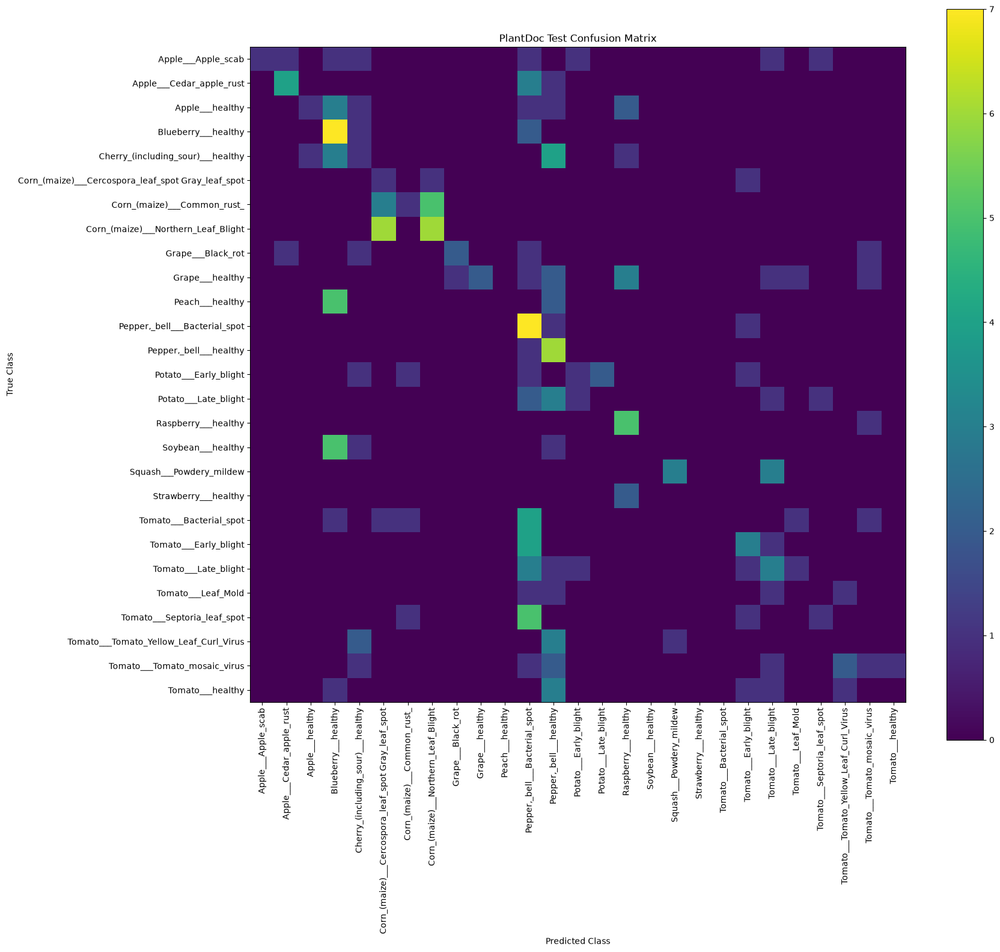

In [63]:
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix

cm = confusion_matrix(
    all_labels,
    all_predictions,
    labels=sorted(set(all_labels))
)

plt.figure(figsize=(18, 16))
plt.imshow(cm)

plt.title("PlantDoc Test Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("True Class")

plt.xticks(
    range(len(sorted(set(all_labels)))),
    [class_names[i] for i in sorted(set(all_labels))],
    rotation=90
)

plt.yticks(
    range(len(sorted(set(all_labels)))),
    [class_names[i] for i in sorted(set(all_labels))]
)

plt.colorbar()
plt.tight_layout()
plt.show()

In [64]:
for class_name in plantdoc_train.classes:
    print(
        f"{class_name:45} -> "
        f"{plantdoc_to_plantvillage.get(class_name, 'NO MAPPING')}"
    )

Apple Scab Leaf                               -> Apple___Apple_scab
Apple leaf                                    -> Apple___healthy
Apple rust leaf                               -> Apple___Cedar_apple_rust
Bell_pepper leaf                              -> Pepper,_bell___healthy
Bell_pepper leaf spot                         -> Pepper,_bell___Bacterial_spot
Blueberry leaf                                -> Blueberry___healthy
Cherry leaf                                   -> Cherry_(including_sour)___healthy
Corn Gray leaf spot                           -> Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Corn leaf blight                              -> Corn_(maize)___Northern_Leaf_Blight
Corn rust leaf                                -> Corn_(maize)___Common_rust_
Peach leaf                                    -> Peach___healthy
Potato leaf early blight                      -> Potato___Early_blight
Potato leaf late blight                       -> Potato___Late_blight
Raspberry leaf        

In [65]:
from collections import Counter

plantdoc_counts = Counter()

for path, label in plantdoc_samples:
    plantdoc_counts[label] += 1

for class_name, original_idx in plantdoc_train.class_to_idx.items():

    if class_name in plantdoc_to_plantvillage:
        target_class = plantdoc_to_plantvillage[class_name]
        target_idx = class_names.index(target_class)

        print(
            f"{class_name:45} | "
            f"{target_class:55} | "
            f"{plantdoc_counts[target_idx]} images"
        )

Apple Scab Leaf                               | Apple___Apple_scab                                      | 83 images
Apple leaf                                    | Apple___healthy                                         | 81 images
Apple rust leaf                               | Apple___Cedar_apple_rust                                | 78 images
Bell_pepper leaf                              | Pepper,_bell___healthy                                  | 53 images
Bell_pepper leaf spot                         | Pepper,_bell___Bacterial_spot                           | 62 images
Blueberry leaf                                | Blueberry___healthy                                     | 103 images
Cherry leaf                                   | Cherry_(including_sour)___healthy                       | 46 images
Corn Gray leaf spot                           | Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot      | 64 images
Corn leaf blight                              | Corn_(maize)___Northern

In [66]:
generic_classes = [
    class_name
    for class_name in plantdoc_train.classes
    if "leaf" in class_name.lower()
]

print("Generic leaf classes:")
for class_name in generic_classes:
    print(
        f"{class_name} -> "
        f"{plantdoc_to_plantvillage.get(class_name, 'NO MAPPING')}"
    )

Generic leaf classes:
Apple Scab Leaf -> Apple___Apple_scab
Apple leaf -> Apple___healthy
Apple rust leaf -> Apple___Cedar_apple_rust
Bell_pepper leaf -> Pepper,_bell___healthy
Bell_pepper leaf spot -> Pepper,_bell___Bacterial_spot
Blueberry leaf -> Blueberry___healthy
Cherry leaf -> Cherry_(including_sour)___healthy
Corn Gray leaf spot -> Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Corn leaf blight -> Corn_(maize)___Northern_Leaf_Blight
Corn rust leaf -> Corn_(maize)___Common_rust_
Peach leaf -> Peach___healthy
Potato leaf early blight -> Potato___Early_blight
Potato leaf late blight -> Potato___Late_blight
Raspberry leaf -> Raspberry___healthy
Soyabean leaf -> Soybean___healthy
Squash Powdery mildew leaf -> Squash___Powdery_mildew
Strawberry leaf -> Strawberry___healthy
Tomato Early blight leaf -> Tomato___Early_blight
Tomato Septoria leaf spot -> Tomato___Septoria_leaf_spot
Tomato leaf -> Tomato___healthy
Tomato leaf bacterial spot -> Tomato___Bacterial_spot
Tomato leaf late 

In [67]:
checkpoint = torch.load(
    best_model_path,
    map_location=device
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

print(
    f"Restored model: "
    f"{checkpoint['best_valid_acc']*100:.2f}%"
)

Restored model: 99.64%


In [68]:
for param in model.parameters():
    param.requires_grad = False

for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

In [69]:
optimizer = torch.optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5
)

print("Optimizer ready")

Optimizer ready


In [70]:
from torch.utils.data import WeightedRandomSampler

num_original = len(train_dataset.samples)
num_plantdoc = len(plantdoc_samples)

original_weight = 0.80 / num_original
plantdoc_weight = 0.20 / num_plantdoc

sample_weights = (
    [original_weight] * num_original +
    [plantdoc_weight] * num_plantdoc
)

sampler = WeightedRandomSampler(
    weights=sample_weights,
    num_samples=num_original,
    replacement=True
)

print("Original images:", num_original)
print("PlantDoc images:", num_plantdoc)
print("Target sampling: 80% Original + 20% PlantDoc")

Original images: 70295
PlantDoc images: 2328
Target sampling: 80% Original + 20% PlantDoc


In [71]:
weighted_loader = DataLoader(
    combined_dataset,
    batch_size=16,
    sampler=sampler,
    num_workers=0
)

print("Weighted DataLoader ready")

Weighted DataLoader ready


In [72]:
images, labels = next(iter(weighted_loader))

print("Batch image shape:", images.shape)
print("Batch labels shape:", labels.shape)

Batch image shape: torch.Size([16, 3, 224, 224])
Batch labels shape: torch.Size([16])


In [73]:
checkpoint = torch.load(
    best_model_path,
    map_location=device
)

model.load_state_dict(
    checkpoint["model_state_dict"]
)

print(f"Restored base model: {checkpoint['best_valid_acc']*100:.2f}%")

Restored base model: 99.64%


In [74]:
plantdoc_test_loss, plantdoc_test_acc = evaluate(
    model,
    plantdoc_test_loader,
    criterion,
    device
)

print(f"Base Model - PlantDoc Test Loss: {plantdoc_test_loss:.4f}")
print(f"Base Model - PlantDoc Test Accuracy: {plantdoc_test_acc*100:.2f}%")

Base Model - PlantDoc Test Loss: 5.9219
Base Model - PlantDoc Test Accuracy: 23.73%


In [75]:
combined_checkpoint = torch.load(
    final_model_path,
    map_location=device
)

model.load_state_dict(
    combined_checkpoint["model_state_dict"]
)

model.eval()

print("Combined model loaded.")
print(
    f"Original validation accuracy: "
    f"{combined_checkpoint['valid_acc']*100:.2f}%"
)

Combined model loaded.
Original validation accuracy: 99.74%


In [76]:
def predict_image(image_path, model, class_names, transform, device):

    image = Image.open(image_path).convert("RGB")

    image_tensor = transform(image)

    image_tensor = image_tensor.unsqueeze(0).to(device)

    model.eval()

    with torch.no_grad():
        output = model(image_tensor)
        probabilities = F.softmax(output, dim=1)

        predicted_class = probabilities.argmax(dim=1).item()
        confidence = probabilities[0, predicted_class].item()

    return {
        "class": class_names[predicted_class],
        "confidence": confidence
    }

In [78]:
import torch.nn.functional as F
corn_path = r"D:\Projects\test_images\corn_leaf.jpg"

result = predict_image(
    corn_path,
    model,
    class_names,
    valid_transform,
    device
)

print("Prediction:", result["class"])
print(f"Confidence: {result['confidence']*100:.2f}%")

Prediction: Pepper,_bell___healthy
Confidence: 98.60%


In [79]:
image = Image.open(corn_path).convert("RGB")
image_tensor = valid_transform(image).unsqueeze(0).to(device)

model.eval()

with torch.no_grad():
    output = model(image_tensor)
    probabilities = F.softmax(output, dim=1)

top5_probs, top5_indices = torch.topk(probabilities, 5)

for prob, idx in zip(top5_probs[0], top5_indices[0]):
    print(
        f"{class_names[idx.item()]}: "
        f"{prob.item()*100:.2f}%"
    )

Pepper,_bell___healthy: 98.60%
Pepper,_bell___Bacterial_spot: 0.86%
Cherry_(including_sour)___healthy: 0.32%
Corn_(maize)___healthy: 0.21%
Tomato___Late_blight: 0.00%


In [80]:
import numpy as np
import matplotlib.pyplot as plt
import torch
import torch.nn.functional as F
from PIL import Image

In [81]:
def generate_gradcam(model, image_tensor, target_layer, device):

    image_input = image_tensor.unsqueeze(0).to(device)

    activation = None
    gradient = None

    def forward_hook(module, input, output):
        nonlocal activation
        activation = output

    def backward_hook(module, grad_input, grad_output):
        nonlocal gradient
        gradient = grad_output[0]

    forward_handle = target_layer.register_forward_hook(
        forward_hook
    )

    backward_handle = target_layer.register_full_backward_hook(
        backward_hook
    )

    model.eval()
    model.zero_grad()

    output = model(image_input)

    probabilities = F.softmax(output, dim=1)

    predicted_class = probabilities.argmax(dim=1).item()
    confidence = probabilities[0, predicted_class].item()

    score = output[0, predicted_class]

    score.backward()

    weights = gradient.mean(
        dim=(2, 3),
        keepdim=True
    )

    cam = (weights * activation).sum(
        dim=1,
        keepdim=True
    )

    cam = F.relu(cam)

    cam = F.interpolate(
        cam,
        size=(224, 224),
        mode="bilinear",
        align_corners=False
    )

    cam = cam.squeeze().detach().cpu().numpy()

    cam = (
        (cam - cam.min()) /
        (cam.max() - cam.min() + 1e-8)
    )

    image_display = (
        image_tensor
        .permute(1, 2, 0)
        .cpu()
        .numpy()
    )

    mean = np.array([0.485, 0.456, 0.406])
    std = np.array([0.229, 0.224, 0.225])

    image_display = image_display * std + mean
    image_display = np.clip(image_display, 0, 1)

    forward_handle.remove()
    backward_handle.remove()

    return {
        "image": image_display,
        "cam": cam,
        "predicted_class": predicted_class,
        "confidence": confidence
    }

In [82]:
gradcam_result = generate_gradcam(
    model,
    image_tensor,
    target_layer,
    device
)

print(
    "Prediction:",
    class_names[gradcam_result["predicted_class"]]
)

print(
    f"Confidence: "
    f"{gradcam_result['confidence']*100:.2f}%"
)

NameError: name 'target_layer' is not defined

NameError: name 'gradcam_result' is not defined

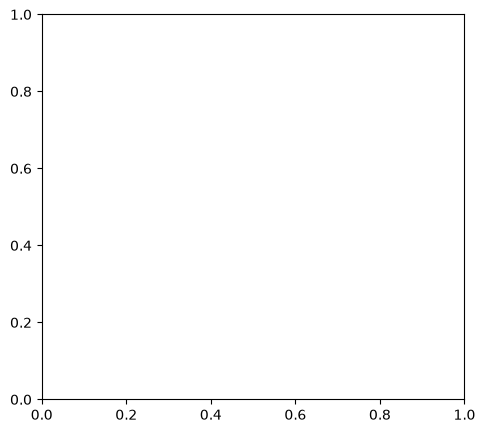

In [83]:
plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(gradcam_result["image"])
plt.title("Original Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gradcam_result["image"])
plt.imshow(
    gradcam_result["cam"],
    cmap="jet",
    alpha=0.45
)
plt.title("Grad-CAM")
plt.axis("off")

plt.tight_layout()
plt.show()

In [84]:
import os
from PIL import Image
import torch
import torch.nn.functional as F

# Folder containing your 8 external images
external_dir = r"D:\Projects\test_images"

# Load best combined model
checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_combined_best.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

results = []

for filename in os.listdir(external_dir):

    path = os.path.join(external_dir, filename)

    if not filename.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
        continue

    image = Image.open(path).convert("RGB")
    image_tensor = valid_transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image_tensor)
        probabilities = F.softmax(output, dim=1)

    confidence, predicted = probabilities.max(1)

    results.append({
        "Image": filename,
        "Prediction": class_names[predicted.item()],
        "Confidence": f"{confidence.item()*100:.2f}%"
    })

for r in results:
    print(f"{r['Image']}")
    print(f"Prediction : {r['Prediction']}")
    print(f"Confidence : {r['Confidence']}")
    print("-" * 60)

Apple scab real field leaf image.webp
Prediction : Grape___Esca_(Black_Measles)
Confidence : 72.80%
------------------------------------------------------------
Blueberry healthy leaf field image.webp
Prediction : Strawberry___Leaf_scorch
Confidence : 54.59%
------------------------------------------------------------
corn.jpg
Prediction : Corn_(maize)___healthy
Confidence : 100.00%
------------------------------------------------------------
corn_leaf.jpg
Prediction : Pepper,_bell___healthy
Confidence : 98.60%
------------------------------------------------------------
corn_leaf_bad.jpg
Prediction : Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Confidence : 92.34%
------------------------------------------------------------
each healthy leaf field image.webp
Prediction : Pepper,_bell___healthy
Confidence : 97.90%
------------------------------------------------------------
Grape black rot real leaf image.jpg
Prediction : Tomato___Late_blight
Confidence : 99.94%
-----------------

In [ ]:
import torch
import torch.nn as nn
import torch.optim as optim
import copy

# Start from the best combined model
model.load_state_dict(
    torch.load(
        r"D:\Projects\Agriculture\plant_disease_resnet50_combined_best.pth",
        map_location=device
    )["model_state_dict"]
)

# Train only layer4 + final classifier
for param in model.parameters():
    param.requires_grad = False

for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

criterion = nn.CrossEntropyLoss()

optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=1e-5
)

best_val_acc = 0.0
best_model_wts = copy.deepcopy(model.state_dict())

for epoch in range(3):

    model.train()
    running_loss = 0.0
    correct = 0
    total = 0

    for images, labels in weighted_loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        running_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

    train_loss = running_loss / total
    train_acc = correct / total

    # Validation
    model.eval()
    val_correct = 0
    val_total = 0
    val_loss_total = 0.0

    with torch.no_grad():

        for images, labels in valid_loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss_total += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)

            val_total += labels.size(0)
            val_correct += (predicted == labels).sum().item()

    val_loss = val_loss_total / val_total
    val_acc = val_correct / val_total

    print(
        f"Epoch {epoch+1}/3 | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc*100:.2f}%"
    )

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        best_model_wts = copy.deepcopy(model.state_dict())

# Restore best epoch
model.load_state_dict(best_model_wts)

# Save
torch.save(
    {
        "model_state_dict": model.state_dict(),
        "class_names": class_names,
        "val_acc": best_val_acc
    },
    r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth"
)

print(f"\nBest Validation Accuracy: {best_val_acc*100:.2f}%")
print("Weighted sampler model saved.")

In [ ]:
checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

correct = 0
total = 0

with torch.no_grad():
    for images, labels in plantdoc_test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

plantdoc_acc = correct / total

print(f"Weighted Sampler PlantDoc Test Accuracy: {plantdoc_acc*100:.2f}%")

In [6]:
# ===== LOAD PROJECT FOR TESTING =====

import torch
import torch.nn as nn
from torchvision import models, transforms, datasets
from torch.utils.data import DataLoader
from PIL import Image
import os

# Device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

# Exact 38 classes
class_names = [
    "Apple___Apple_scab",
    "Apple___Black_rot",
    "Apple___Cedar_apple_rust",
    "Apple___healthy",
    "Blueberry___healthy",
    "Cherry_(including_sour)___Powdery_mildew",
    "Cherry_(including_sour)___healthy",
    "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot",
    "Corn_(maize)___Common_rust_",
    "Corn_(maize)___Northern_Leaf_Blight",
    "Corn_(maize)___healthy",
    "Grape___Black_rot",
    "Grape___Esca_(Black_Measles)",
    "Grape___Leaf_blight_(Isariopsis_Leaf_Spot)",
    "Grape___healthy",
    "Orange___Haunglongbing_(Citrus_greening)",
    "Peach___Bacterial_spot",
    "Peach___healthy",
    "Pepper,_bell___Bacterial_spot",
    "Pepper,_bell___healthy",
    "Potato___Early_blight",
    "Potato___Late_blight",
    "Potato___healthy",
    "Raspberry___healthy",
    "Soybean___healthy",
    "Squash___Powdery_mildew",
    "Strawberry___Leaf_scorch",
    "Strawberry___healthy",
    "Tomato___Bacterial_spot",
    "Tomato___Early_blight",
    "Tomato___Late_blight",
    "Tomato___Leaf_Mold",
    "Tomato___Septoria_leaf_spot",
    "Tomato___Spider_mites Two-spotted_spider_mite",
    "Tomato___Target_Spot",
    "Tomato___Tomato_Yellow_Leaf_Curl_Virus",
    "Tomato___Tomato_mosaic_virus",
    "Tomato___healthy"
]

# Validation / external-test preprocessing
valid_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# Create same ResNet50 architecture
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, 38)
model = model.to(device)

# Load saved weighted model
checkpoint_path = r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth"

checkpoint = torch.load(
    checkpoint_path,
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model.eval()

print("Model loaded successfully")
print("Device:", device)
print("Validation accuracy:", checkpoint["val_acc"] * 100)
print("Classes:", len(class_names))

Model loaded successfully
Device: cuda
Validation accuracy: 99.76102418207682
Classes: 38


In [7]:
print("Device:", device)
print("Number of classes:", len(class_names))
print("First 10 classes:", class_names[:10])

print("\nModel:")
print(type(model))

print("\nCheckpoint classes:")
checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth",
    map_location=device
)

print("Checkpoint val acc:", checkpoint.get("val_acc"))
print("Checkpoint class count:", len(checkpoint["class_names"]))
print("Classes same:", class_names == checkpoint["class_names"])

Device: cuda
Number of classes: 38
First 10 classes: ['Apple___Apple_scab', 'Apple___Black_rot', 'Apple___Cedar_apple_rust', 'Apple___healthy', 'Blueberry___healthy', 'Cherry_(including_sour)___Powdery_mildew', 'Cherry_(including_sour)___healthy', 'Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot', 'Corn_(maize)___Common_rust_', 'Corn_(maize)___Northern_Leaf_Blight']

Model:
<class 'torchvision.models.resnet.ResNet'>

Checkpoint classes:
Checkpoint val acc: 0.9976102418207682
Checkpoint class count: 38
Classes same: True


In [8]:
plantdoc_test_dir = r"D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master\test"

plantdoc_test_raw = datasets.ImageFolder(plantdoc_test_dir)

print("PlantDoc test images:", len(plantdoc_test_raw))
print("PlantDoc test classes:", len(plantdoc_test_raw.classes))

PlantDoc test images: 236
PlantDoc test classes: 27


In [10]:
# PlantDoc test -> our 38 model classes
# PlantDoc test -> 38 model classes

plantdoc_to_plantvillage = {
    "Apple Scab Leaf": "Apple___Apple_scab",
    "Apple leaf": "Apple___healthy",
    "Apple rust leaf": "Apple___Cedar_apple_rust",
    "Bell_pepper leaf": "Pepper,_bell___healthy",
    "Bell_pepper leaf spot": "Pepper,_bell___Bacterial_spot",
    "Blueberry leaf": "Blueberry___healthy",
    "Cherry leaf": "Cherry_(including_sour)___healthy",
    "Corn Gray leaf spot": "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot",
    "Corn leaf blight": "Corn_(maize)___Northern_Leaf_Blight",
    "Corn rust leaf": "Corn_(maize)___Common_rust_",
    "Peach leaf": "Peach___healthy",
    "Potato leaf early blight": "Potato___Early_blight",
    "Potato leaf late blight": "Potato___Late_blight",
    "Raspberry leaf": "Raspberry___healthy",
    "Soyabean leaf": "Soybean___healthy",
    "Squash Powdery mildew leaf": "Squash___Powdery_mildew",
    "Strawberry leaf": "Strawberry___healthy",
    "Tomato Early blight leaf": "Tomato___Early_blight",
    "Tomato Septoria leaf spot": "Tomato___Septoria_leaf_spot",
    "Tomato leaf": "Tomato___healthy",
    "Tomato leaf bacterial spot": "Tomato___Bacterial_spot",
    "Tomato leaf late blight": "Tomato___Late_blight",
    "Tomato leaf mosaic virus": "Tomato___Tomato_mosaic_virus",
    "Tomato leaf yellow virus": "Tomato___Tomato_Yellow_Leaf_Curl_Virus",
    "Tomato mold leaf": "Tomato___Leaf_Mold",
    "Tomato two spotted spider mites leaf": "Tomato___Spider_mites Two-spotted_spider_mite",
    "grape leaf": "Grape___healthy",
    "grape leaf black rot": "Grape___Black_rot"
}

plantdoc_test_samples = []

for path, plantdoc_label in plantdoc_test_raw.samples:

    plantdoc_class = plantdoc_test_raw.classes[plantdoc_label]

    if plantdoc_class in plantdoc_to_plantvillage:

        target_class = plantdoc_to_plantvillage[plantdoc_class]
        target_label = class_names.index(target_class)

        plantdoc_test_samples.append((path, target_label))

print("Mapped PlantDoc test images:", len(plantdoc_test_samples))
plantdoc_test_samples = []

for path, plantdoc_label in plantdoc_test_raw.samples:

    plantdoc_class = plantdoc_test_raw.classes[plantdoc_label]

    if plantdoc_class in plantdoc_to_plantvillage:
        target_class = plantdoc_to_plantvillage[plantdoc_class]
        target_label = class_names.index(target_class)

        plantdoc_test_samples.append((path, target_label))

print("Mapped PlantDoc test images:", len(plantdoc_test_samples))
print("Expected:", 236)

Mapped PlantDoc test images: 236
Mapped PlantDoc test images: 236
Expected: 236


In [11]:
# Create mapped PlantDoc test dataset

class PlantDocMappedTestDataset(torch.utils.data.Dataset):
    def __init__(self, samples, transform=None):
        self.samples = samples
        self.transform = transform

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        path, label = self.samples[idx]

        image = Image.open(path).convert("RGB")

        if self.transform:
            image = self.transform(image)

        return image, label


plantdoc_test_dataset = PlantDocMappedTestDataset(
    plantdoc_test_samples,
    transform=valid_transform
)

plantdoc_test_loader = DataLoader(
    plantdoc_test_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=0
)

print("Test dataset:", len(plantdoc_test_dataset))
print("Test batches:", len(plantdoc_test_loader))

Test dataset: 236
Test batches: 15


In [12]:
# Evaluate weighted model on PlantDoc test set

model.eval()

correct = 0
total = 0

with torch.no_grad():
    for images, labels in plantdoc_test_loader:
        images = images.to(device)
        labels = labels.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        total += labels.size(0)
        correct += (predicted == labels).sum().item()

plantdoc_acc = correct / total

print(f"Weighted Sampler PlantDoc Test Accuracy: {plantdoc_acc*100:.2f}%")

Weighted Sampler PlantDoc Test Accuracy: 64.41%


In [13]:
# Test weighted model on external real-world images

import os
from PIL import Image
import torch.nn.functional as F

external_dir = r"D:\Projects\test_images"

model.eval()

for filename in sorted(os.listdir(external_dir)):

    if not filename.lower().endswith((".jpg", ".jpeg", ".png", ".webp")):
        continue

    path = os.path.join(external_dir, filename)

    image = Image.open(path).convert("RGB")
    image_tensor = valid_transform(image).unsqueeze(0).to(device)

    with torch.no_grad():
        output = model(image_tensor)
        probabilities = F.softmax(output, dim=1)

    confidence, predicted = probabilities.max(1)

    print(filename)
    print(f"Prediction : {class_names[predicted.item()]}")
    print(f"Confidence : {confidence.item()*100:.2f}%")
    print("-" * 60)

Apple scab real field leaf image.webp
Prediction : Apple___Cedar_apple_rust
Confidence : 83.85%
------------------------------------------------------------
Blueberry healthy leaf field image.webp
Prediction : Blueberry___healthy
Confidence : 84.17%
------------------------------------------------------------
Grape black rot real leaf image.jpg
Prediction : Grape___Black_rot
Confidence : 99.97%
------------------------------------------------------------
Tomato early blight real field leaf image.webp
Prediction : Tomato___Early_blight
Confidence : 95.70%
------------------------------------------------------------
corn.jpg
Prediction : Corn_(maize)___healthy
Confidence : 99.93%
------------------------------------------------------------
corn_leaf.jpg
Prediction : Corn_(maize)___Northern_Leaf_Blight
Confidence : 58.51%
------------------------------------------------------------
corn_leaf_bad.jpg
Prediction : Corn_(maize)___Northern_Leaf_Blight
Confidence : 54.14%
---------------------

===== WEIGHTED MODEL — PLANTDOC TEST =====

                                                    precision    recall  f1-score   support

                                Apple___Apple_scab       0.78      0.70      0.74        10
                          Apple___Cedar_apple_rust       0.88      0.70      0.78        10
                                   Apple___healthy       0.45      0.56      0.50         9
                               Blueberry___healthy       0.70      0.64      0.67        11
                 Cherry_(including_sour)___healthy       0.67      0.60      0.63        10
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot       0.00      0.00      0.00         4
                       Corn_(maize)___Common_rust_       1.00      0.80      0.89        10
               Corn_(maize)___Northern_Leaf_Blight       0.58      0.58      0.58        12
                                 Grape___Black_rot       0.89      1.00      0.94         8
                                   

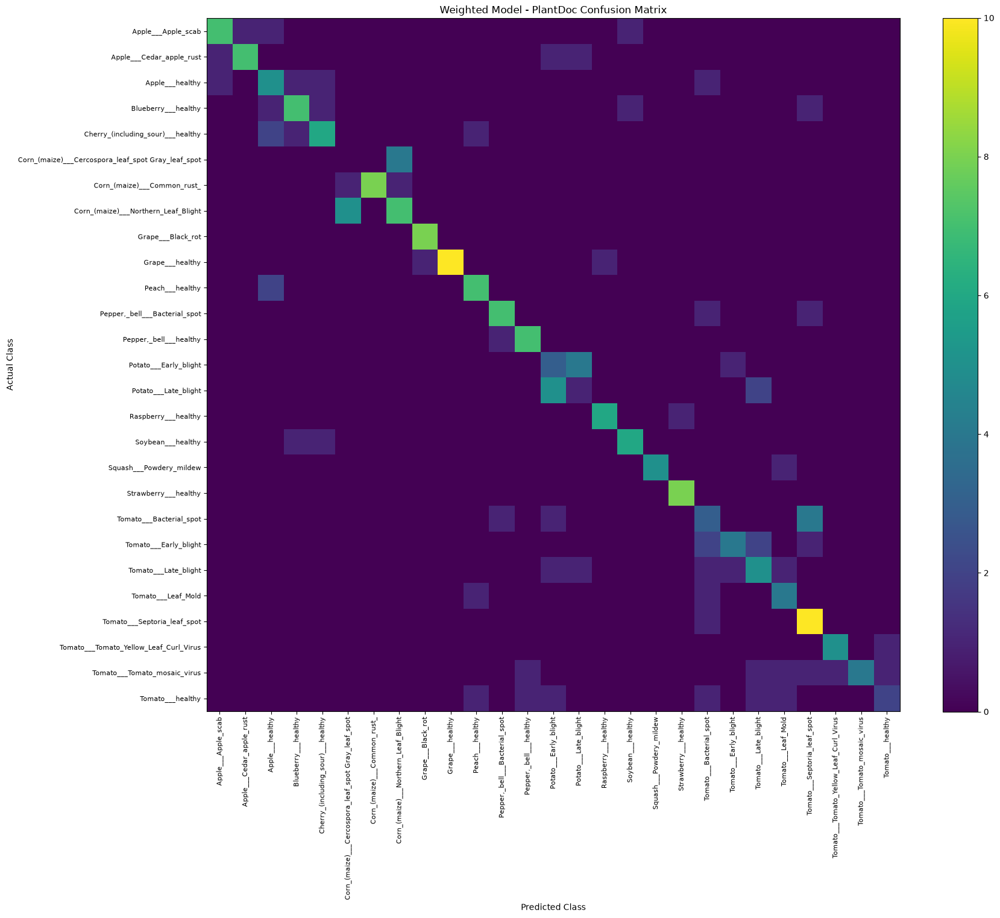

In [14]:
from sklearn.metrics import classification_report, confusion_matrix
import numpy as np
import matplotlib.pyplot as plt

model.eval()

all_labels = []
all_predictions = []

with torch.no_grad():
    for images, labels in plantdoc_test_loader:

        images = images.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        all_labels.extend(labels.numpy())
        all_predictions.extend(predicted.cpu().numpy())

# Classification report
print("===== WEIGHTED MODEL — PLANTDOC TEST =====\n")

print(
    classification_report(
        all_labels,
        all_predictions,
        labels=sorted(set(all_labels)),
        target_names=[class_names[i] for i in sorted(set(all_labels))],
        zero_division=0
    )
)

# Confusion matrix
cm = confusion_matrix(
    all_labels,
    all_predictions,
    labels=sorted(set(all_labels))
)

plt.figure(figsize=(18, 15))
plt.imshow(cm)
plt.title("Weighted Model - PlantDoc Confusion Matrix")
plt.xlabel("Predicted Class")
plt.ylabel("Actual Class")
plt.colorbar()

labels_present = [class_names[i] for i in sorted(set(all_labels))]

plt.xticks(
    range(len(labels_present)),
    labels_present,
    rotation=90,
    fontsize=8
)

plt.yticks(
    range(len(labels_present)),
    labels_present,
    fontsize=8
)

plt.tight_layout()
plt.show()

In [15]:
# Find the most common wrong predictions

import numpy as np

cm = confusion_matrix(
    all_labels,
    all_predictions,
    labels=sorted(set(all_labels))
)

present_labels = sorted(set(all_labels))

wrong_pairs = []

for i in range(len(present_labels)):
    for j in range(len(present_labels)):
        if i != j and cm[i, j] > 0:
            wrong_pairs.append((
                cm[i, j],
                class_names[present_labels[i]],
                class_names[present_labels[j]]
            ))

# Sort from most frequent confusion to least
wrong_pairs.sort(reverse=True)

print("===== TOP CONFUSIONS =====\n")

for count, actual, predicted in wrong_pairs[:15]:
    print(f"{count} image(s): {actual}  →  {predicted}")

===== TOP CONFUSIONS =====

5 image(s): Potato___Late_blight  →  Potato___Early_blight
5 image(s): Corn_(maize)___Northern_Leaf_Blight  →  Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
4 image(s): Tomato___Bacterial_spot  →  Tomato___Septoria_leaf_spot
4 image(s): Potato___Early_blight  →  Potato___Late_blight
4 image(s): Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot  →  Corn_(maize)___Northern_Leaf_Blight
2 image(s): Tomato___Early_blight  →  Tomato___Late_blight
2 image(s): Tomato___Early_blight  →  Tomato___Bacterial_spot
2 image(s): Potato___Late_blight  →  Tomato___Late_blight
2 image(s): Peach___healthy  →  Apple___healthy
2 image(s): Cherry_(including_sour)___healthy  →  Apple___healthy
1 image(s): Tomato___healthy  →  Tomato___Leaf_Mold
1 image(s): Tomato___healthy  →  Tomato___Late_blight
1 image(s): Tomato___healthy  →  Tomato___Bacterial_spot
1 image(s): Tomato___healthy  →  Potato___Early_blight
1 image(s): Tomato___healthy  →  Pepper,_bell___healthy


In [16]:
from collections import Counter

target_classes = [
    "Potato___Early_blight",
    "Potato___Late_blight",
    "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot",
    "Corn_(maize)___Northern_Leaf_Blight",
    "Tomato___Bacterial_spot",
    "Tomato___Early_blight",
    "Tomato___Late_blight",
    "Tomato___healthy"
]

counts = Counter(label for _, label in plantdoc_test_samples)

print("PlantDoc TEST counts:\n")

for cls in target_classes:
    label = class_names.index(cls)
    print(f"{cls}: {counts[label]}")

PlantDoc TEST counts:

Potato___Early_blight: 8
Potato___Late_blight: 8
Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot: 4
Corn_(maize)___Northern_Leaf_Blight: 12
Tomato___Bacterial_spot: 9
Tomato___Early_blight: 9
Tomato___Late_blight: 10
Tomato___healthy: 8


In [18]:
import os

plantdoc_train_dir = r"D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master\train"

plantdoc_train_classes = os.listdir(plantdoc_train_dir)

target_plantdoc_classes = [
    "Potato leaf early blight",
    "Potato leaf late blight",
    "Corn Gray leaf spot",
    "Corn leaf blight",
    "Tomato leaf bacterial spot",
    "Tomato Early blight leaf",
    "Tomato leaf late blight",
    "Tomato leaf"
]

print("PlantDoc TRAIN counts:\n")

for cls in target_plantdoc_classes:
    folder = os.path.join(plantdoc_train_dir, cls)

    if os.path.exists(folder):
        count = sum(
            1 for f in os.listdir(folder)
            if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))
        )
        print(f"{cls}: {count}")
    else:
        print(f"{cls}: NOT FOUND")

PlantDoc TRAIN counts:

Potato leaf early blight: 108
Potato leaf late blight: 97
Corn Gray leaf spot: 64
Corn leaf blight: 179
Tomato leaf bacterial spot: 101
Tomato Early blight leaf: 79
Tomato leaf late blight: 101
Tomato leaf: 55


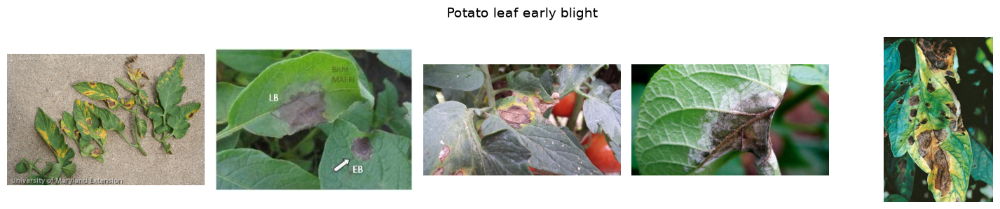

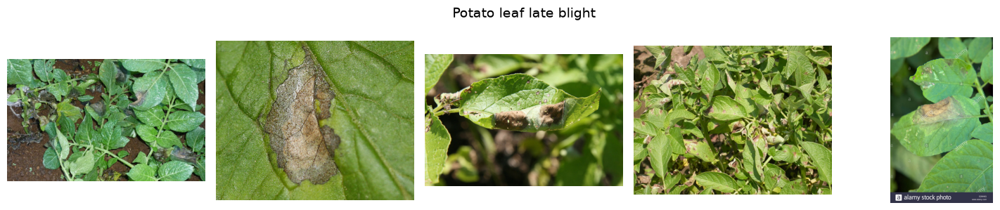

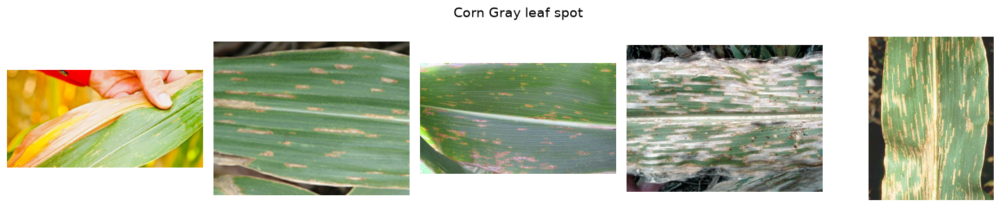

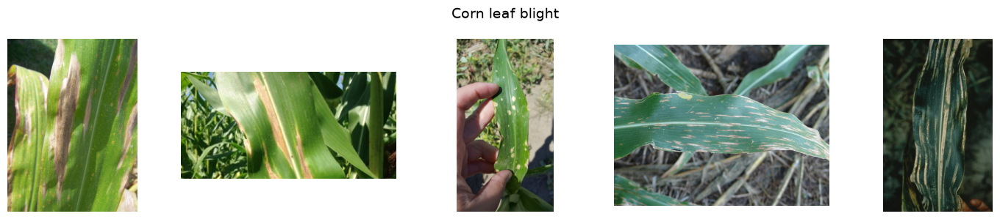

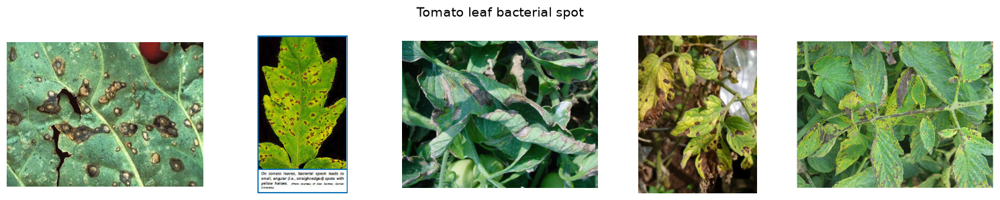

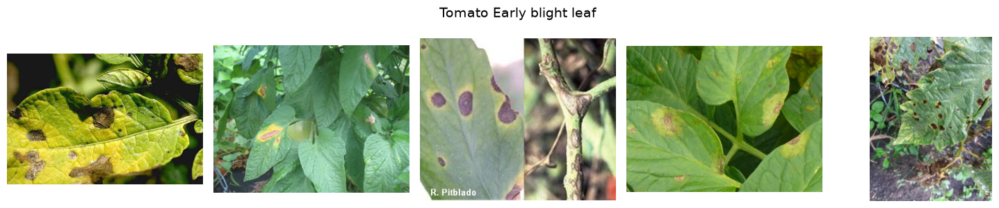

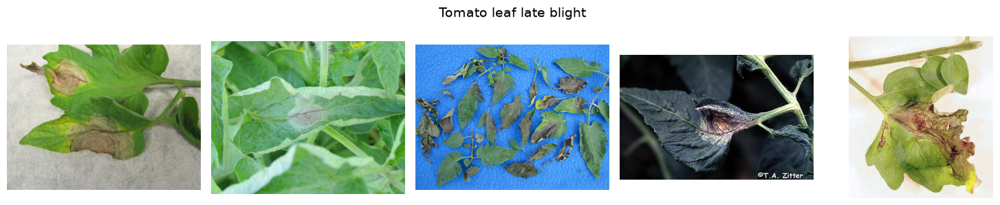

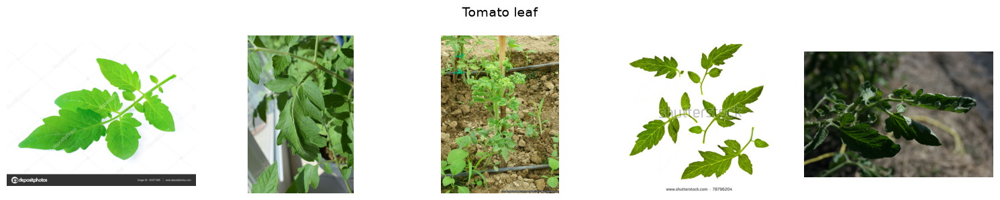

In [19]:
import os
import random
import matplotlib.pyplot as plt
from PIL import Image

plantdoc_train_dir = r"D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master\train"

classes_to_inspect = [
    "Potato leaf early blight",
    "Potato leaf late blight",
    "Corn Gray leaf spot",
    "Corn leaf blight",
    "Tomato leaf bacterial spot",
    "Tomato Early blight leaf",
    "Tomato leaf late blight",
    "Tomato leaf"
]

for cls in classes_to_inspect:

    folder = os.path.join(plantdoc_train_dir, cls)

    images = [
        f for f in os.listdir(folder)
        if f.lower().endswith((".jpg", ".jpeg", ".png", ".webp"))
    ]

    selected = random.sample(images, min(5, len(images)))

    plt.figure(figsize=(15, 3))
    plt.suptitle(cls, fontsize=14)

    for i, filename in enumerate(selected):

        path = os.path.join(folder, filename)
        image = Image.open(path).convert("RGB")

        plt.subplot(1, 5, i + 1)
        plt.imshow(image)
        plt.axis("off")

    plt.tight_layout()
    plt.show()


ACTUAL:    Potato___Late_blight
PREDICTED: Potato___Early_blight
Wrong images found: 5


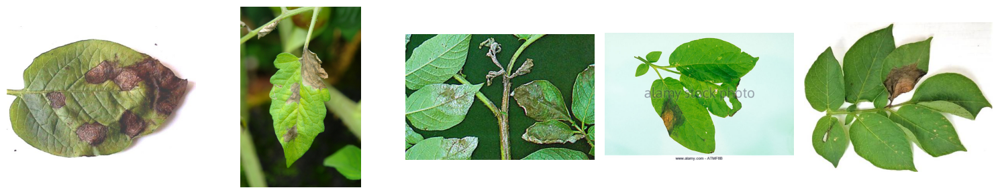


ACTUAL:    Corn_(maize)___Northern_Leaf_Blight
PREDICTED: Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
Wrong images found: 5


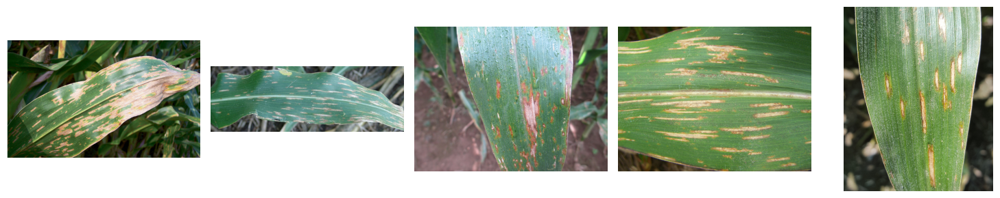


ACTUAL:    Tomato___Bacterial_spot
PREDICTED: Tomato___Septoria_leaf_spot
Wrong images found: 4


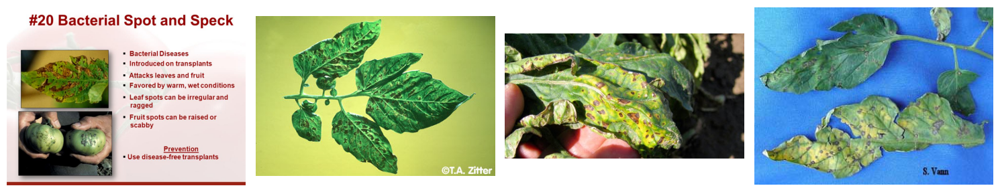


ACTUAL:    Tomato___Early_blight
PREDICTED: Tomato___Late_blight
Wrong images found: 2


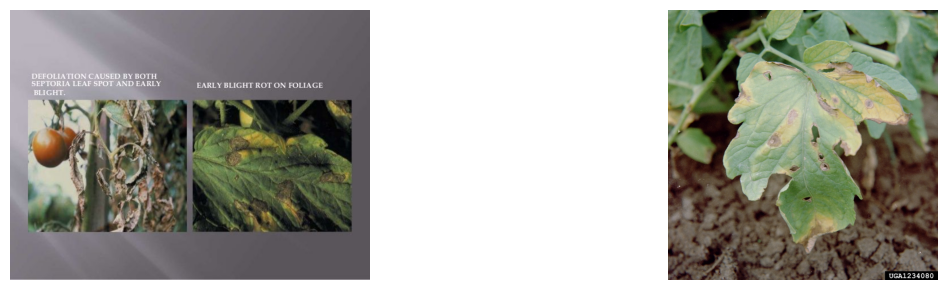

In [20]:
# Inspect the main confusion pairs

import matplotlib.pyplot as plt
from PIL import Image

pairs_to_check = [
    (
        "Potato___Late_blight",
        "Potato___Early_blight"
    ),
    (
        "Corn_(maize)___Northern_Leaf_Blight",
        "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot"
    ),
    (
        "Tomato___Bacterial_spot",
        "Tomato___Septoria_leaf_spot"
    ),
    (
        "Tomato___Early_blight",
        "Tomato___Late_blight"
    )
]

for actual_class, predicted_class in pairs_to_check:

    actual_label = class_names.index(actual_class)
    predicted_label = class_names.index(predicted_class)

    matching_images = []

    for idx in range(len(plantdoc_test_samples)):

        path, true_label = plantdoc_test_samples[idx]

        if true_label != actual_label:
            continue

        image = Image.open(path).convert("RGB")
        image_tensor = valid_transform(image).unsqueeze(0).to(device)

        with torch.no_grad():
            output = model(image_tensor)
            prediction = output.argmax(1).item()

        if prediction == predicted_label:
            matching_images.append(path)

    print("\n" + "=" * 80)
    print(f"ACTUAL:    {actual_class}")
    print(f"PREDICTED: {predicted_class}")
    print(f"Wrong images found: {len(matching_images)}")

    if matching_images:

        plt.figure(figsize=(15, 3))

        for i, path in enumerate(matching_images[:5]):

            image = Image.open(path).convert("RGB")

            plt.subplot(1, min(5, len(matching_images)), i + 1)
            plt.imshow(image)
            plt.axis("off")

        plt.tight_layout()
        plt.show()

In [21]:
# ===== TARGETED FINE-TUNING SETUP =====

from torch.utils.data import Dataset, DataLoader, WeightedRandomSampler
from torchvision import datasets, transforms
from PIL import Image
import os
import torch

# -----------------------------
# 1. Original PlantVillage data
# -----------------------------
train_dir = r"D:\Projects\Agriculture\New Plant Diseases Dataset(Augmented)\New Plant Diseases Dataset(Augmented)\train"

original_dataset = datasets.ImageFolder(train_dir)

# -----------------------------
# 2. Transforms
# -----------------------------
original_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

plantdoc_transform = transforms.Compose([
    transforms.Resize((224, 224)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ToTensor(),
    transforms.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225]
    )
])

# -----------------------------
# 3. PlantDoc training samples
# -----------------------------
plantdoc_train_dir = r"D:\Projects\Agriculture\PlantDoc-Dataset-master\PlantDoc-Dataset-master\train"

plantdoc_raw = datasets.ImageFolder(plantdoc_train_dir)

plantdoc_to_plantvillage = {
    "Apple Scab Leaf": "Apple___Apple_scab",
    "Apple leaf": "Apple___healthy",
    "Apple rust leaf": "Apple___Cedar_apple_rust",
    "Bell_pepper leaf": "Pepper,_bell___healthy",
    "Bell_pepper leaf spot": "Pepper,_bell___Bacterial_spot",
    "Blueberry leaf": "Blueberry___healthy",
    "Cherry leaf": "Cherry_(including_sour)___healthy",
    "Corn Gray leaf spot": "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot",
    "Corn leaf blight": "Corn_(maize)___Northern_Leaf_Blight",
    "Corn rust leaf": "Corn_(maize)___Common_rust_",
    "Peach leaf": "Peach___healthy",
    "Potato leaf early blight": "Potato___Early_blight",
    "Potato leaf late blight": "Potato___Late_blight",
    "Raspberry leaf": "Raspberry___healthy",
    "Soyabean leaf": "Soybean___healthy",
    "Squash Powdery mildew leaf": "Squash___Powdery_mildew",
    "Strawberry leaf": "Strawberry___healthy",
    "Tomato Early blight leaf": "Tomato___Early_blight",
    "Tomato Septoria leaf spot": "Tomato___Septoria_leaf_spot",
    "Tomato leaf": "Tomato___healthy",
    "Tomato leaf bacterial spot": "Tomato___Bacterial_spot",
    "Tomato leaf late blight": "Tomato___Late_blight",
    "Tomato leaf mosaic virus": "Tomato___Tomato_mosaic_virus",
    "Tomato leaf yellow virus": "Tomato___Tomato_Yellow_Leaf_Curl_Virus",
    "Tomato mold leaf": "Tomato___Leaf_Mold",
    "Tomato two spotted spider mites leaf": "Tomato___Spider_mites Two-spotted_spider_mite",
    "grape leaf": "Grape___healthy",
    "grape leaf black rot": "Grape___Black_rot"
}

plantdoc_samples_target = []

for path, label in plantdoc_raw.samples:

    plantdoc_class = plantdoc_raw.classes[label]

    if plantdoc_class in plantdoc_to_plantvillage:

        target_class = plantdoc_to_plantvillage[plantdoc_class]
        target_label = class_names.index(target_class)

        plantdoc_samples_target.append((path, target_label))

# -----------------------------
# 4. Combined dataset
# -----------------------------
class TargetedCombinedDataset(Dataset):

    def __init__(self, original_dataset, plantdoc_samples):
        self.original_dataset = original_dataset
        self.plantdoc_samples = plantdoc_samples
        self.total = len(original_dataset.samples) + len(plantdoc_samples)

    def __len__(self):
        return self.total

    def __getitem__(self, idx):

        if idx < len(self.original_dataset.samples):

            path, label = self.original_dataset.samples[idx]

            image = Image.open(path).convert("RGB")
            image = original_transform(image)

            return image, label

        else:

            path, label = self.plantdoc_samples[
                idx - len(self.original_dataset.samples)
            ]

            image = Image.open(path).convert("RGB")
            image = plantdoc_transform(image)

            return image, label


targeted_dataset = TargetedCombinedDataset(
    original_dataset,
    plantdoc_samples_target
)

# -----------------------------
# 5. Targeted weighting
# -----------------------------
num_original = len(original_dataset.samples)
num_plantdoc = len(plantdoc_samples_target)

target_classes = {
    class_names.index("Potato___Early_blight"),
    class_names.index("Potato___Late_blight"),
    class_names.index("Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot"),
    class_names.index("Corn_(maize)___Northern_Leaf_Blight")
}

sample_weights = []

# Original PlantVillage samples
original_weight = 0.80 / num_original

for _, label in original_dataset.samples:
    sample_weights.append(original_weight)

# PlantDoc samples
for _, label in plantdoc_samples_target:

    weight = 0.20 / num_plantdoc

    # Give problematic classes extra representation
    if label in target_classes:
        weight *= 3.0

    sample_weights.append(weight)

targeted_sampler = WeightedRandomSampler(
    sample_weights,
    num_samples=num_original,
    replacement=True
)

targeted_loader = DataLoader(
    targeted_dataset,
    batch_size=16,
    sampler=targeted_sampler,
    num_workers=0
)

print("Original images:", num_original)
print("PlantDoc images:", num_plantdoc)
print("Targeted combined dataset:", len(targeted_dataset))
print("Targeted loader ready.")

Original images: 70295
PlantDoc images: 2336
Targeted combined dataset: 72631
Targeted loader ready.


In [23]:
# Remove missing files from targeted PlantDoc samples

valid_targeted_samples = []

for path, label in plantdoc_samples_target:
    if os.path.exists(path):
        valid_targeted_samples.append((path, label))

print("Original PlantDoc samples:", len(plantdoc_samples_target))
print("Valid PlantDoc samples:", len(valid_targeted_samples))
print("Missing files skipped:", 
      len(plantdoc_samples_target) - len(valid_targeted_samples))

Original PlantDoc samples: 2336
Valid PlantDoc samples: 2328
Missing files skipped: 8


In [25]:
# ===== REBUILD TARGETED DATASET WITHOUT MISSING FILES =====

# Keep only files that actually exist
valid_targeted_samples = [
    (path, label)
    for path, label in plantdoc_samples_target
    if os.path.isfile(path)
]

print("Original PlantDoc samples:", len(plantdoc_samples_target))
print("Valid PlantDoc samples:", len(valid_targeted_samples))
print("Missing files skipped:",
      len(plantdoc_samples_target) - len(valid_targeted_samples))


# Rebuild dataset using ONLY valid samples
targeted_dataset = TargetedCombinedDataset(
    original_dataset,
    valid_targeted_samples
)


# Recalculate weights
num_original = len(original_dataset.samples)
num_plantdoc = len(valid_targeted_samples)

target_classes = {
    class_names.index("Potato___Early_blight"),
    class_names.index("Potato___Late_blight"),
    class_names.index(
        "Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot"
    ),
    class_names.index(
        "Corn_(maize)___Northern_Leaf_Blight"
    )
}

sample_weights = []

# Original PlantVillage
original_weight = 0.80 / num_original

for _, label in original_dataset.samples:
    sample_weights.append(original_weight)


# Valid PlantDoc
for _, label in valid_targeted_samples:

    weight = 0.20 / num_plantdoc

    if label in target_classes:
        weight *= 3.0

    sample_weights.append(weight)


targeted_sampler = WeightedRandomSampler(
    sample_weights,
    num_samples=num_original,
    replacement=True
)


# Rebuild loader
targeted_loader = DataLoader(
    targeted_dataset,
    batch_size=16,
    sampler=targeted_sampler,
    num_workers=0
)

print("\nTargeted dataset:", len(targeted_dataset))
print("Targeted loader rebuilt successfully.")

Original PlantDoc samples: 2336
Valid PlantDoc samples: 2328
Missing files skipped: 8

Targeted dataset: 72623
Targeted loader rebuilt successfully.


In [61]:
# Recreate validation loader

valid_loader = DataLoader(
    valid_dataset,
    batch_size=16,
    shuffle=False,
    num_workers=0
)

print("Validation loader ready:", len(valid_loader))

Validation loader ready: 1099


In [63]:
# ===== TARGETED FINE-TUNING =====

import torch
import torch.nn as nn
import torch.optim as optim
from torchvision import models

# Load current BEST weighted model
model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, len(class_names))

checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model = model.to(device)

# Freeze everything
for param in model.parameters():
    param.requires_grad = False

# Fine-tune only layer4 + final classifier
for param in model.layer4.parameters():
    param.requires_grad = True

for param in model.fc.parameters():
    param.requires_grad = True

# Optimizer
optimizer = optim.Adam(
    filter(lambda p: p.requires_grad, model.parameters()),
    lr=5e-6
)

criterion = nn.CrossEntropyLoss()

best_val_acc = 0.0

for epoch in range(2):

    # ---------- TRAIN ----------
    model.train()

    train_loss = 0.0
    train_correct = 0
    train_total = 0

    for images, labels in targeted_loader:

        images = images.to(device)
        labels = labels.to(device)

        optimizer.zero_grad()

        outputs = model(images)
        loss = criterion(outputs, labels)

        loss.backward()
        optimizer.step()

        train_loss += loss.item() * images.size(0)

        _, predicted = torch.max(outputs, 1)

        train_correct += (predicted == labels).sum().item()
        train_total += labels.size(0)

    train_loss /= train_total
    train_acc = train_correct / train_total

    # ---------- VALIDATION ----------
    model.eval()

    val_loss = 0.0
    val_correct = 0
    val_total = 0

    with torch.no_grad():

        for images, labels in valid_loader:

            images = images.to(device)
            labels = labels.to(device)

            outputs = model(images)
            loss = criterion(outputs, labels)

            val_loss += loss.item() * images.size(0)

            _, predicted = torch.max(outputs, 1)

            val_correct += (predicted == labels).sum().item()
            val_total += labels.size(0)

    val_loss /= val_total
    val_acc = val_correct / val_total

    print(
        f"Epoch {epoch+1}/2 | "
        f"Train Loss: {train_loss:.4f} | "
        f"Train Acc: {train_acc*100:.2f}% | "
        f"Val Loss: {val_loss:.4f} | "
        f"Val Acc: {val_acc*100:.2f}%"
    )

    # Save best targeted model
    if val_acc > best_val_acc:

        best_val_acc = val_acc

        torch.save(
            {
                "model_state_dict": model.state_dict(),
                "val_acc": val_acc,
                "class_names": class_names
            },
            r"D:\Projects\Agriculture\plant_disease_resnet50_targeted_best.pth"
        )

        print("  Best targeted model saved.")

print("\nTargeted fine-tuning complete.")
print(f"Best validation accuracy: {best_val_acc*100:.2f}%")

Epoch 1/2 | Train Loss: 0.1326 | Train Acc: 95.54% | Val Loss: 0.0084 | Val Acc: 99.75%
  Best targeted model saved.
Epoch 2/2 | Train Loss: 0.0974 | Train Acc: 96.77% | Val Loss: 0.0078 | Val Acc: 99.77%
  Best targeted model saved.

Targeted fine-tuning complete.
Best validation accuracy: 99.77%


In [64]:
# ===== EVALUATE TARGETED MODEL ON PLANTDOC TEST =====

import torch
from sklearn.metrics import accuracy_score, classification_report

# Load targeted best checkpoint
checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_targeted_best.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model = model.to(device)
model.eval()

all_preds = []
all_labels = []

with torch.no_grad():

    for images, labels in plantdoc_test_loader:

        images = images.to(device)

        outputs = model(images)
        _, predicted = torch.max(outputs, 1)

        all_preds.extend(predicted.cpu().numpy())
        all_labels.extend(labels.numpy())

targeted_plantdoc_acc = accuracy_score(all_labels, all_preds)

print(f"Targeted PlantDoc Test Accuracy: {targeted_plantdoc_acc*100:.2f}%")

Targeted PlantDoc Test Accuracy: 61.86%


In [65]:
# ===== GRAD-CAM SETUP =====

import torch
import torch.nn.functional as F
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image
from torchvision import models
import torch.nn as nn

# --------------------------------------------------
# 1. Load the FINAL weighted model
# --------------------------------------------------

model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, len(class_names))

checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model = model.to(device)
model.eval()

print("Weighted model loaded.")
print(f"Validation accuracy: {checkpoint['val_acc']*100:.2f}%")

# --------------------------------------------------
# 2. Grad-CAM target layer
# --------------------------------------------------

target_layer = model.layer4[-1]

activations = None
gradients = None

def forward_hook(module, input, output):
    global activations
    activations = output

def backward_hook(module, grad_input, grad_output):
    global gradients
    gradients = grad_output[0]

target_layer.register_forward_hook(forward_hook)
target_layer.register_full_backward_hook(backward_hook)

print("Grad-CAM hooks registered.")
print("Target layer:", target_layer)

Weighted model loaded.
Validation accuracy: 99.76%
Grad-CAM hooks registered.
Target layer: Bottleneck(
  (conv1): Conv2d(2048, 512, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn1): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv2): Conv2d(512, 512, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
  (bn2): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (conv3): Conv2d(512, 2048, kernel_size=(1, 1), stride=(1, 1), bias=False)
  (bn3): BatchNorm2d(2048, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace=True)
)


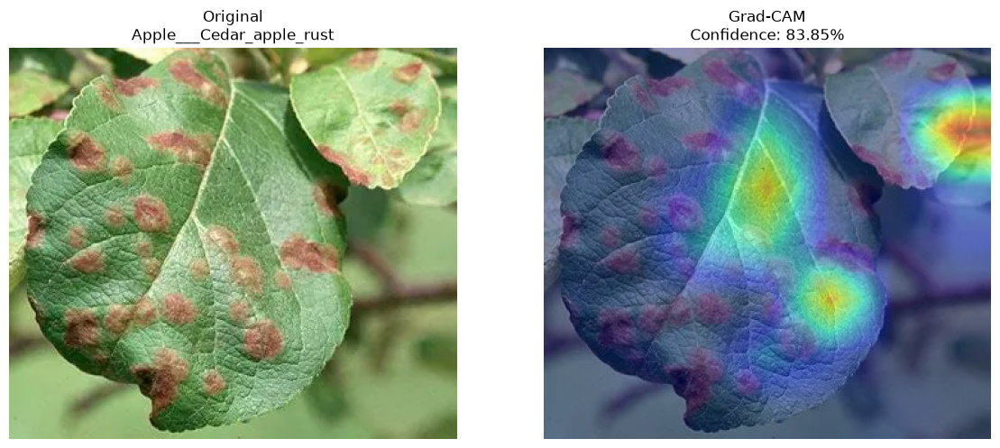

Predicted class: Apple___Cedar_apple_rust
Confidence: 83.85%


In [69]:
# ===== GENERATE GRAD-CAM =====

image_path = r"D:\Projects\test_images\Apple scab real field leaf image.webp"

# Load image
image = Image.open(image_path).convert("RGB")

# Preprocess
input_tensor = valid_transform(image).unsqueeze(0).to(device)

# Forward pass
model.zero_grad()

output = model(input_tensor)

predicted_class = output.argmax(dim=1).item()
confidence = torch.softmax(output, dim=1)[0, predicted_class].item()

# Backward pass for predicted class
output[0, predicted_class].backward()

# Get activations and gradients
activation = activations[0]
gradient = gradients[0]

# Calculate weights
weights = gradient.mean(dim=(1, 2))

# Generate CAM
cam = torch.zeros(activation.shape[1:], device=device)

for i, w in enumerate(weights):
    cam += w * activation[i]

cam = F.relu(cam)

# Normalize CAM
cam -= cam.min()
cam /= (cam.max() + 1e-8)

# Resize CAM to original image size
cam = F.interpolate(
    cam.unsqueeze(0).unsqueeze(0),
    size=(image.height, image.width),
    mode="bilinear",
    align_corners=False
)

cam = cam.squeeze().detach().cpu().numpy()

# --------------------------------------------------
# Display
# --------------------------------------------------

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(image)
plt.title(
    f"Original\n{class_names[predicted_class]}"
)
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(image)
plt.imshow(cam, cmap="jet", alpha=0.45)
plt.title(
    f"Grad-CAM\nConfidence: {confidence*100:.2f}%"
)
plt.axis("off")

plt.tight_layout()
plt.show()

print("Predicted class:", class_names[predicted_class])
print(f"Confidence: {confidence*100:.2f}%")

PlantDoc test images: 236


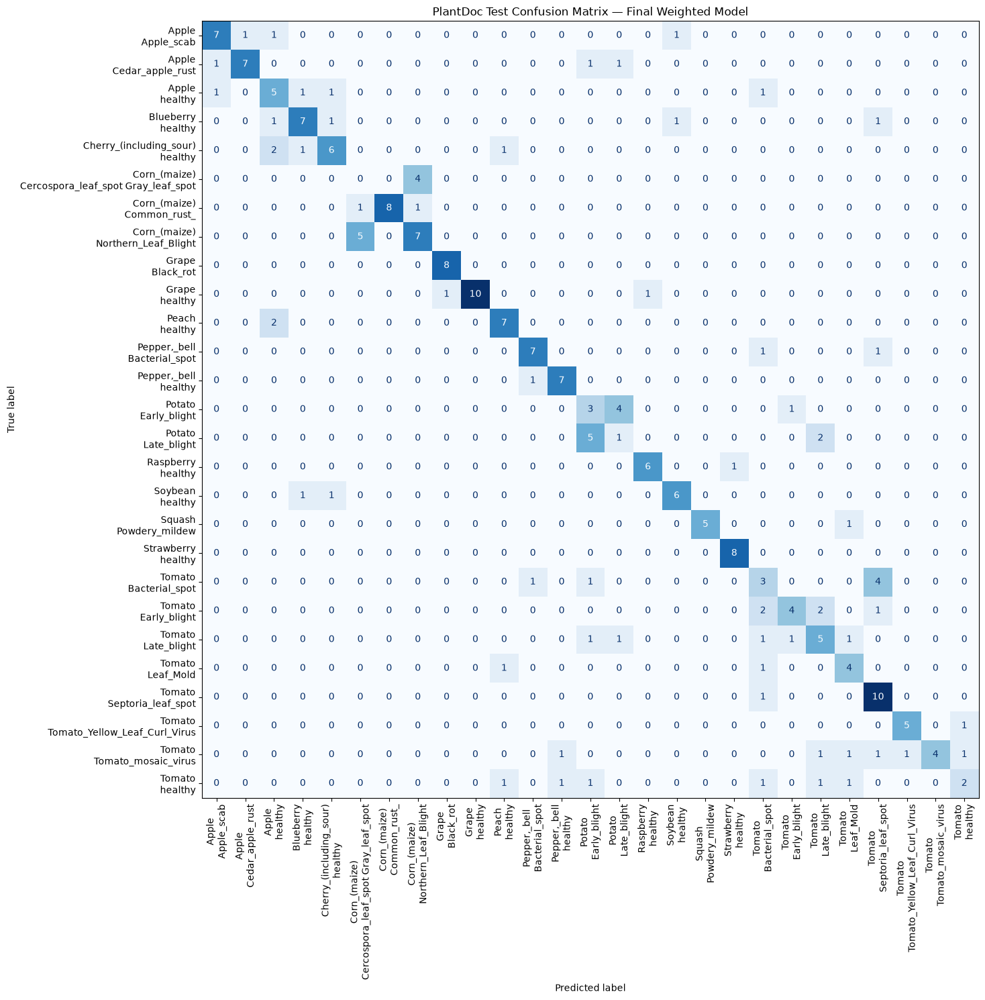


Top Confusions:

5 image(s): Potato___Late_blight → Potato___Early_blight
5 image(s): Corn_(maize)___Northern_Leaf_Blight → Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot
4 image(s): Tomato___Bacterial_spot → Tomato___Septoria_leaf_spot
4 image(s): Potato___Early_blight → Potato___Late_blight
4 image(s): Corn_(maize)___Cercospora_leaf_spot Gray_leaf_spot → Corn_(maize)___Northern_Leaf_Blight
2 image(s): Tomato___Early_blight → Tomato___Late_blight
2 image(s): Tomato___Early_blight → Tomato___Bacterial_spot
2 image(s): Potato___Late_blight → Tomato___Late_blight
2 image(s): Peach___healthy → Apple___healthy
2 image(s): Cherry_(including_sour)___healthy → Apple___healthy
1 image(s): Tomato___healthy → Tomato___Leaf_Mold
1 image(s): Tomato___healthy → Tomato___Late_blight
1 image(s): Tomato___healthy → Tomato___Bacterial_spot
1 image(s): Tomato___healthy → Potato___Early_blight
1 image(s): Tomato___healthy → Pepper,_bell___healthy


In [70]:
# ===== FINAL WEIGHTED MODEL — CONFUSION MATRIX =====

import torch
import torch.nn as nn
from torchvision import models
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# --------------------------------------------------
# 1. Load FINAL weighted model
# --------------------------------------------------

model = models.resnet50(weights=None)
model.fc = nn.Linear(model.fc.in_features, len(class_names))

checkpoint = torch.load(
    r"D:\Projects\Agriculture\plant_disease_resnet50_weighted_best.pth",
    map_location=device
)

model.load_state_dict(checkpoint["model_state_dict"])
model = model.to(device)
model.eval()

# --------------------------------------------------
# 2. Predict on PlantDoc test set
# --------------------------------------------------

all_preds = []
all_labels = []

with torch.no_grad():

    for images, labels in plantdoc_test_loader:

        images = images.to(device)

        outputs = model(images)
        predictions = outputs.argmax(dim=1)

        all_preds.extend(predictions.cpu().numpy())
        all_labels.extend(labels.numpy())

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)

print("PlantDoc test images:", len(all_labels))

# --------------------------------------------------
# 3. Confusion Matrix
# --------------------------------------------------

present_classes = sorted(
    set(all_labels.tolist()) | set(all_preds.tolist())
)

cm = confusion_matrix(
    all_labels,
    all_preds,
    labels=present_classes
)

display_labels = [
    class_names[i].replace("___", "\n")
    for i in present_classes
]

fig, ax = plt.subplots(figsize=(18, 15))

disp = ConfusionMatrixDisplay(
    confusion_matrix=cm,
    display_labels=display_labels
)

disp.plot(
    ax=ax,
    xticks_rotation=90,
    cmap="Blues",
    values_format="d",
    colorbar=False
)

plt.title("PlantDoc Test Confusion Matrix — Final Weighted Model")
plt.tight_layout()
plt.show()

# --------------------------------------------------
# 4. Print biggest confusions
# --------------------------------------------------

print("\nTop Confusions:\n")

confusions = []

for i in range(len(present_classes)):
    for j in range(len(present_classes)):

        if i != j and cm[i, j] > 0:
            confusions.append(
                (
                    cm[i, j],
                    class_names[present_classes[i]],
                    class_names[present_classes[j]]
                )
            )

confusions.sort(reverse=True)

for count, actual, predicted in confusions[:15]:

    print(
        f"{count} image(s): "
        f"{actual} → {predicted}"
    )